## Pipeline (test images)

| CRITERIA | MEETS SPECIFICATIONS|
|-------------|-------------------------------|
| Provide an example of a distortion-corrected image.| Distortion correction that was calculated via camera calibration has been correctly applied to each image. An example of a distortion corrected image should be included in the writeup (or saved to a folder) and submitted with the project.|
| Describe how (and identify where in your code) you used color transforms, gradients or other methods to create a thresholded binary image. Provide an example of a binary image result. | A method or combination of methods (i.e., color transforms, gradients) has been used to create a binary image containing likely lane pixels. There is no "ground truth" here, just visual verification that the pixels identified as part of the lane lines are, in fact, part of the lines. Example binary images should be included in the writeup (or saved to a folder) and submitted with the project. |
| Describe how (and identify where in your code) you performed a perspective transform and provide an example of a transformed image. | OpenCV function or other method has been used to correctly rectify each image to a "birds-eye view". Transformed images should be included in the writeup (or saved to a folder) and submitted with the project. | 
| Describe how (and identify where in your code) you identified lane-line pixels and fit their positions with a polynomial? | Methods have been used to identify lane line pixels in the rectified binary image. The left and right line have been identified and fit with a curved functional form (e.g., spine or polynomial). Example images with line pixels identified and a fit overplotted should be included in the writeup (or saved to a folder) and submitted with the project. |
| Describe how (and identify where in your code) you calculated the radius of curvature of the lane and the position of the vehicle with respect to center. | Here the idea is to take the measurements of where the lane lines are and estimate how much the road is curving and where the vehicle is located with respect to the center of the lane. The radius of curvature may be given in meters assuming the curve of the road follows a circle. For the position of the vehicle, you may assume the camera is mounted at the center of the car and the deviation of the midpoint of the lane from the center of the image is the offset you're looking for. As with the polynomial fitting, convert from pixels to meters. | 
| Provide an example image of your result plotted back down onto the road such that the lane area is identified clearly. | The fit from the rectified image has been warped back onto the original image and plotted to identify the lane boundaries. This should demonstrate that the lane boundaries were correctly identified. An example image with lanes, curvature, and position from center should be included in the writeup (or saved to a folder) and submitted with the project.| 




In [1]:
import glob, os
import pickle

from PIL import Image

import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

## Prepare object points and Find corners as image points

Cannot find corners in ./camera_cal/calibration1.jpg


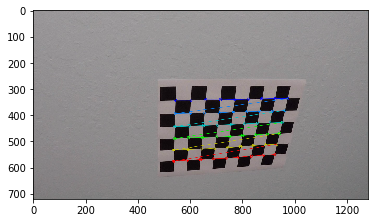

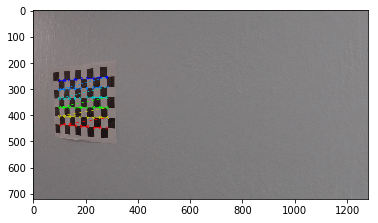

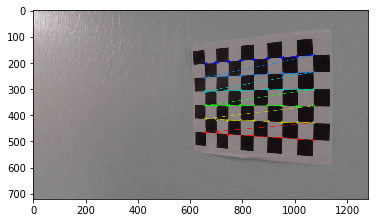

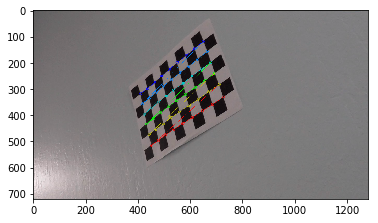

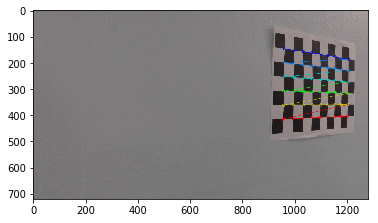

...

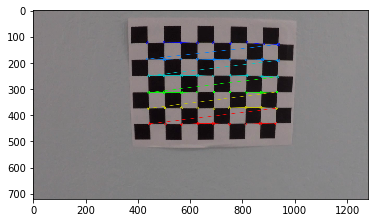

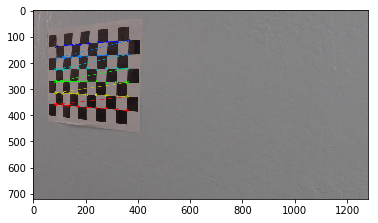

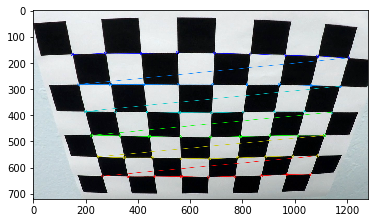

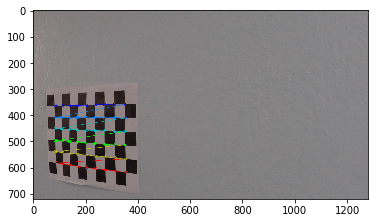

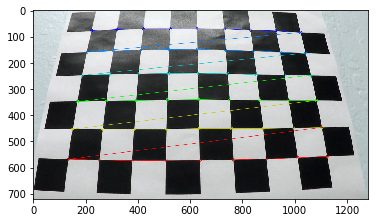

Cannot find corners in ./camera_cal/calibration4.jpg
Cannot find corners in ./camera_cal/calibration5.jpg


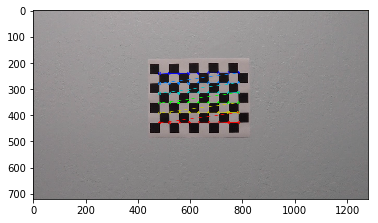

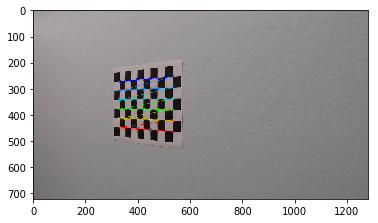

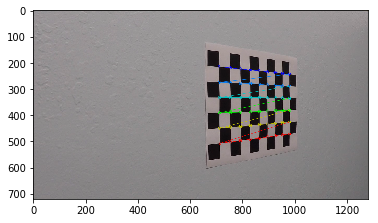

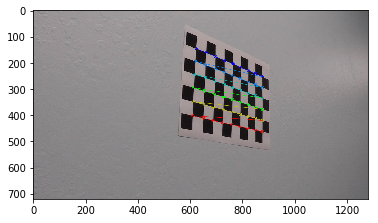

In [2]:
# prepare object points
nx = 9 # the number of inside corners in x
ny = 6 # the number of inside corners in y
objectpoint = np.zeros((nx * ny, 3), np.float32)
objectpoint[:, :2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)

# Make a list of calibration images
caribrated_filenames = []
images = []
image_shape = None
objectpoints = []
imagepoints = []
filenames = glob.glob("./camera_cal/*.jpg")
for filename in filenames:
    img = cv2.imread(filename)

    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    image_shape = gray.shape

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    # If found, draw corners
    if ret == True:
        caribrated_filenames.append(os.path.basename(filename))
        images.append(img.copy())
        objectpoints.append(objectpoint.copy())
        imagepoints.append(corners)
        
        # Draw and display the corners
        cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        plt.imshow(img)
        plt.show()
    else:
        print("Cannot find corners in %s" % (filename))

## Caribrate camera

In [ ]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objectpoints, imagepoints, image_shape[::-1], None, None)

In [3]:
# Save the camera matrix, the distortion coefficient and so on.
saved_info = {
    'ret': ret,
    'mtx': mtx,
    'dist': dist,
    "rvecs": rvecs,
    'tvecs': tvecs,
}
with open("./camera_cal/caribration_matrix.pickle", "wb") as f:
    pickle.dump(saved_info, f, protocol=pickle.HIGHEST_PROTOCOL)

In [ ]:
# Load the camera matrix, the distortion coefficient and so on.
with open("./camera_cal/caribration_matrix.pickle", "rb") as f:
    saved_info = pickle.load(f)
    ret, mtx, dist, rvecs, tvecs = saved_info['ret'], saved_info['mtx'], saved_info['dist'], saved_info['rvecs'], saved_info['tvecs']

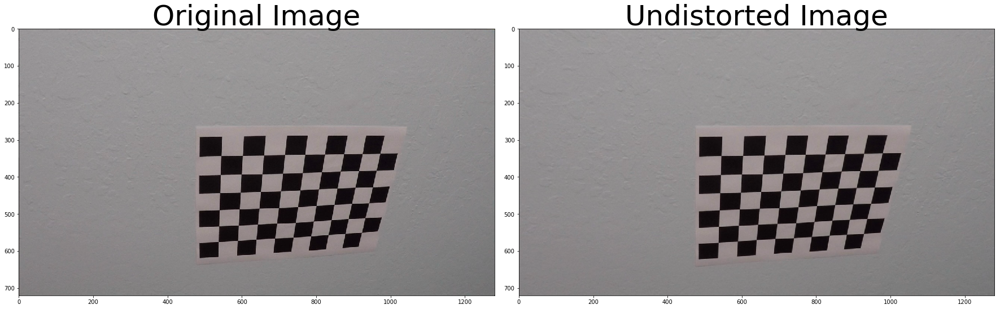

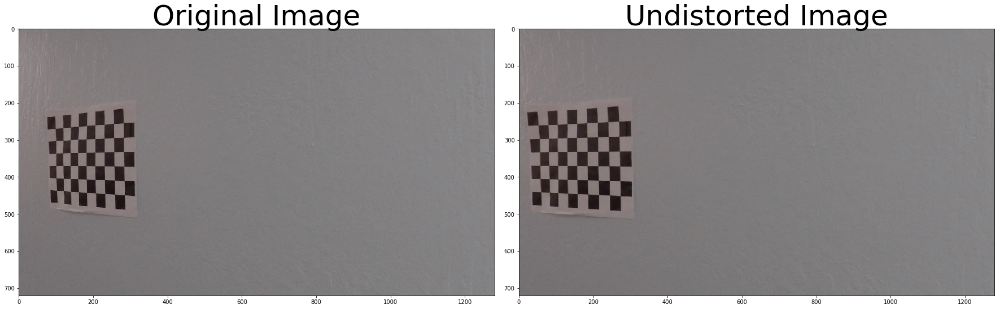

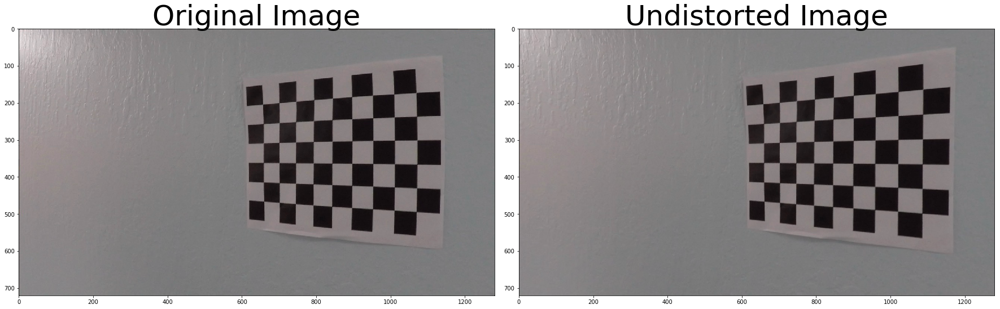

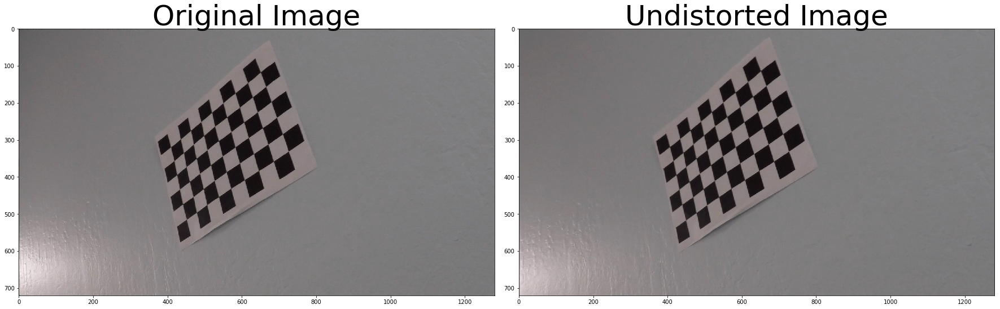

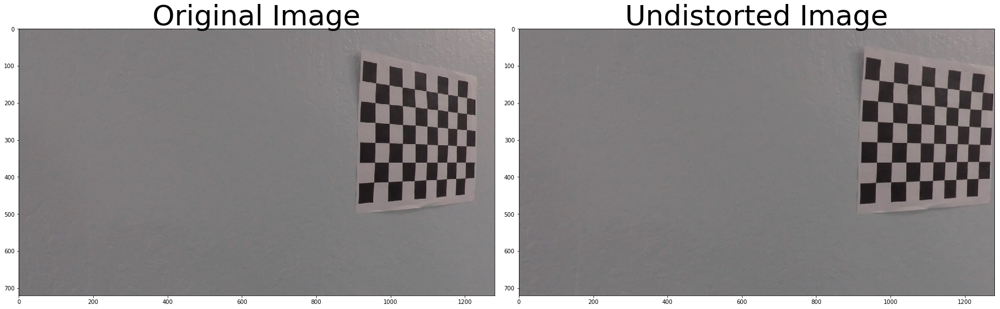

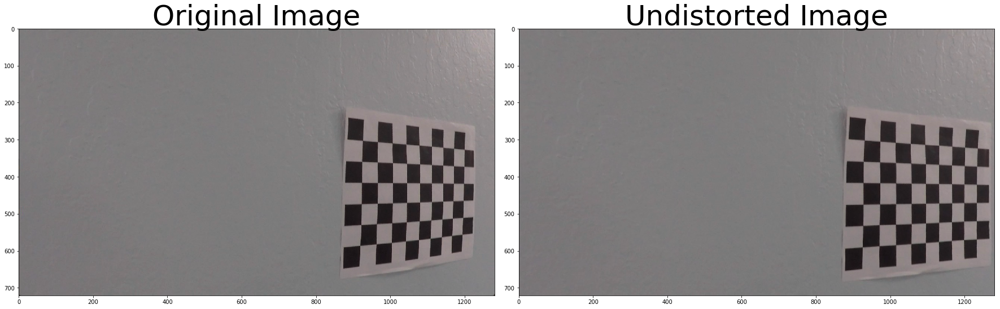

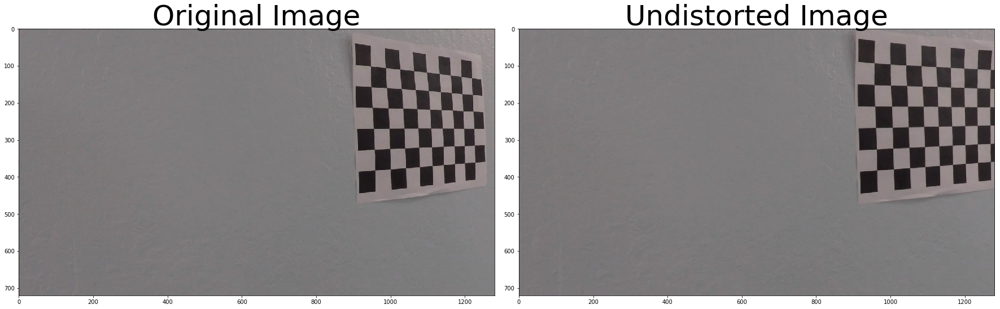

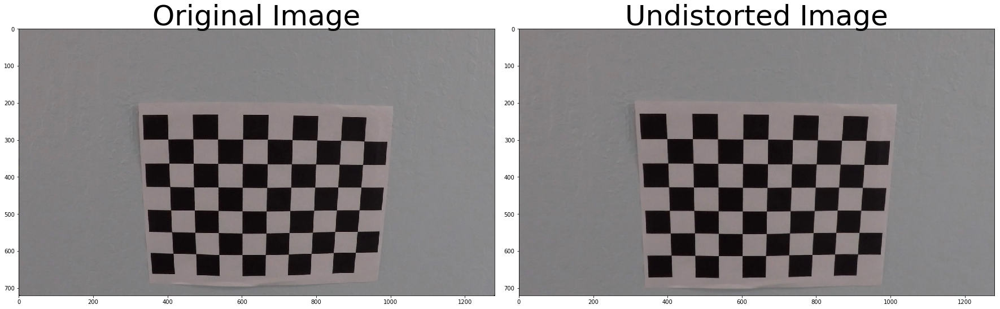

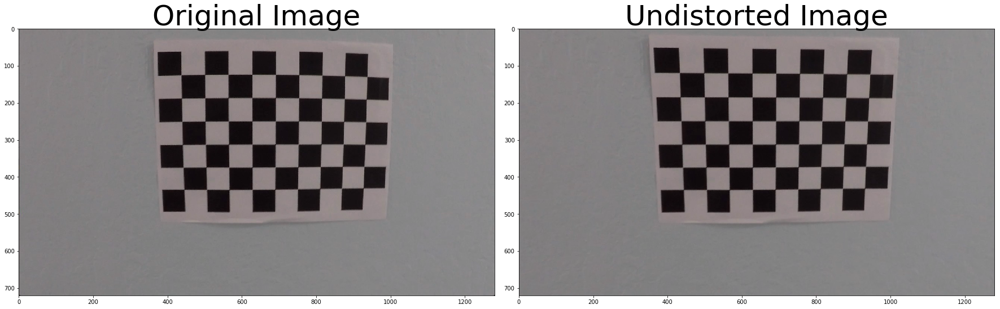

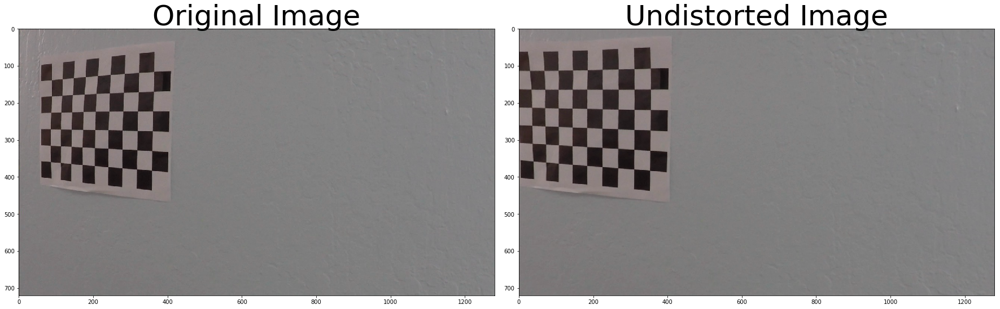

In [ ]:
for i in range(0, len(images)):
    image = images[i]
    filename = caribrated_filenames[i]
    undistorted = cv2.undistort(image, mtx, dist, None, mtx)
    ## Save a undistorted image
    Image.fromarray(undistorted).save("./output_images/undistorted%s" % (filename))
    
    ## Show paris of an original images and a undistorted image
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(undistorted)
    ax2.set_title('Undistorted Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()